# Development: Improve Low-level Planning for Single Agents

In [1]:
import sys
sys.path.append('../')
from panav.environment.env import MultiTunnelEnv, DefaultEmtpyEnv
from panav.hybrid import HybridGraph
from panav.util import flowtime,makespan
from panav.PBS.PBS import PBS
from panav.TrafficAwarePlanning import TAHP
from panav.sequential import sequential_planning
from panav.SAMP.solvers import Tube_Planning, Simple_MILP_Planning



from time import time
import pickle as pkl

%load_ext autoreload
%autoreload 2


%load_ext snakeviz

In [2]:
bloating_r = 0.5
vmax = 1.0

n_agents = [20]

TIMEOUT = 100 # 1 minute timeout

# Algorithms
algs = {
        "TAHP": lambda hg: TAHP(hg,vmax=vmax,bloating_r=bloating_r,TIMEOUT=TIMEOUT),
        # "Seq_Temp_Obs": lambda hg: sequential_planning(Simple_MILP_Planning,hg.env,vmax,bloating_r,TIMEOUT=TIMEOUT)
        }

timeouted = {alg:False for alg in algs}

results = []

env_name = "MultiTunnel"
limits = [(-15,15),(-15,15)] 

# Experiments
for i in range(len(n_agents)):
    N = n_agents[i]
    # env = MultiTunnelEnv(n_tunnel = 4, tunnel_width = bloating_r*2.5, N_agent = N)

    # env = MultiTunnelEnv(n_tunnel = n_tunnel, tunnel_width = bloating_r*3.0,limits=limits, N_agent = N)
    env = DefaultEmtpyEnv(limits=limits, N_agent = N)

    HG = HybridGraph(env,bloating_r)

    for name,alg in algs.items():

        if timeouted[name]:
            continue
        
        print("Alg:", name, "N agent:",N)

        result = {}
        
        t0 = time()
        plan = alg(HG)
        t = time()-t0
        
        result['plan'] = plan
        result['time'] = t

        result['N_agent'] = N
        result['alg_name'] = name

        result["TIMEOUT"]=TIMEOUT
        result["HG"]=HG

        results.append(result)

        
        if t>TIMEOUT:
            timeouted[name] = True
            print("Time out for algorithm", name, "N agent = ", N)



Set parameter Username
Academic license - for non-commercial use only - expires 2025-02-15
Alg: TAHP N agent: 20
Planning for 0/20
num obstacle trajectories:0/0
number of integer constraints: 0
Planning for 1/20
num obstacle trajectories:0/1
number of integer constraints: 0
K_min 1
num obstacle trajectories:1/1
number of integer constraints: 12
number of integer constraints: 24
Planning for 2/20
num obstacle trajectories:0/3
number of integer constraints: 0
K_min 1
num obstacle trajectories:1/3
number of integer constraints: 12
number of integer constraints: 24
K_min 2
num obstacle trajectories:3/3
number of integer constraints: 72
Planning for 3/20
num obstacle trajectories:0/5
number of integer constraints: 0
K_min 1
num obstacle trajectories:1/5
number of integer constraints: 12
number of integer constraints: 24
K_min 2
num obstacle trajectories:3/5
number of integer constraints: 72
Planning for 4/20
num obstacle trajectories:0/7
number of integer constraints: 0
K_min 1
num obstacle

In [3]:
result

{'plan': [(array([ 0.     , 33.58757]),
   array([[ 10.5 , -12.25],
          [ 12.  , -11.75]])),
  (array([-0.     , 16.11172, 35.21734]),
   array([[ 10.5    ,   0.69088, -12.25   ],
          [  9.33333,  -0.50508,  -9.08333]])),
  (array([-0.     ,  1.59472, 39.15021]),
   array([[ 10.5    ,  11.62764, -12.25   ],
          [  6.66667,   5.53903,  -6.91667]])),
  (array([-0.     , 16.61172, 36.84712]),
   array([[ 10.5    ,   1.45612, -12.25   ],
          [  4.     ,  -7.74626,  -4.25   ]])),
  (array([-0.     ,  1.59472, 43.75108]),
   array([[ 10.5    ,  11.62764, -12.25   ],
          [  1.33333,   0.20569,  -1.58333]])),
  (array([-0.     ,  2.43856, 45.64836]),
   array([[ 10.5    ,  12.22432, -12.25   ],
          [ -1.33333,  -3.05765,   1.08333]])),
  (array([-0.     ,  2.79898,  4.48665, 45.64836]),
   array([[ 10.5    ,   9.87091,  11.06427, -12.25   ],
          [ -4.     ,  -2.02082,  -0.91748,   3.75   ]])),
  (array([-0.     ,  3.28239, 47.54564]),
   array([[ 10.5 

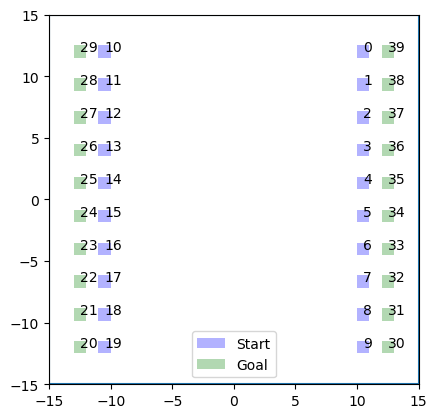

In [4]:
from panav.viz import draw_hybrid
# # Save checkpoint data
# with open("./data/{}_misc.pkl".format(env_name),'wb') as fp:
#     pkl.dump({"TIMEOUT":TIMEOUT,"HG":HG},fp)

draw_hybrid(HG)

NameError: name 'plt' is not defined

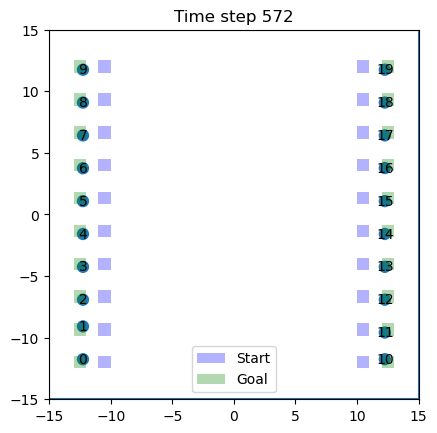

In [5]:
from panav.viz import animation,interpolate_positions

from IPython.display import HTML, display
interp_dt = 0.1
pos = []
for cp in result['plan']:
    _,xs = interpolate_positions(*cp,interp_dt)
    pos.append(xs)

anim = animation(HG.env, pos, bloating_r=0.5, dt = interp_dt)
display(HTML(anim.to_jshtml()))
plt.close()   # Avoid plotting an extra figure.